In [140]:
import numpy as np
import pandas as pd
import folium
import re

In [86]:
data = pd.read_csv('200k_Restaurants_Mostly_US.csv')
data.head()

,Title,Address,Link,Category,Rating,Website,Phone,Images,Categories,Latitude,Longitude
0,Dakota Farms Restaurant Williston,"Dakota Farms Restaurant Williston, 1906 2nd Av...",https://www.google.com/maps/place/Dakota+Farms...,American restaurant,4.2,https://www.dakotafarmsrestaurants.com/,+1 701-572-4480,[{'thumbnail': 'https://lh5.googleusercontent....,"['American restaurant', 'Breakfast restaurant'...",48.162545,-103.625242
1,Scusi! (Oak on Main),"Scusi! (Oak on Main), 337 E Main St, Pullman, ...",https://www.google.com/maps/place/Scusi!+%28Oa...,Restaurant,4.0,http://oakpullman.com/,+1 509-339-6300,[{'thumbnail': 'https://lh5.googleusercontent....,['Restaurant'],46.7293424,-117.179115
2,New Lucky Garden,"205 Midtown Plz, Beaver Dam",NaN,restaurant,NaN,NaN,NaN,NaN,NaN,37.4088087,-86.875185
3,Hampton Chutney Co.,"Hampton Chutney Co., 107 Newtown Ln, East Hamp...",https://www.google.com/maps/place/Hampton+Chut...,Indian restaurant,4.5,http://www.hamptonchutney.com/,+1 631-267-3131,[{'thumbnail': 'https://lh5.googleusercontent....,"['Indian restaurant', 'Asian restaurant', 'Res...",40.9650468,-72.191427
4,Tan's Chinese Restaurant,"Tan's Chinese Restaurant, 1195 Bishop Blvd, Pu...",https://www.google.com/maps/place/Tan%27s+Chin...,Chinese restaurant,4.5,NaN,+1 509-339-6303,[{'thumbnail': 'https://lh5.googleusercontent....,['Chinese restaurant'],46.7165968,-117.165101


In [137]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6590 entries, 0 to 6603
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Title       6590 non-null   object 
 1   Address     6588 non-null   object 
 2   Link        6026 non-null   object 
 3   Category    6589 non-null   object 
 4   Rating      5882 non-null   float64
 5   Website     4981 non-null   object 
 6   Phone       5779 non-null   object 
 7   Images      6026 non-null   object 
 8   Categories  6025 non-null   object 
 9   Latitude    6590 non-null   object 
 10  Longitude   6590 non-null   float64
 11  state       6272 non-null   object 
 12  country     6537 non-null   object 
dtypes: float64(2), object(11)
memory usage: 720.8+ KB


In [130]:
pd.set_option('display.max_colwidth', None)
data.Address.head()


,Address
0,"Dakota Farms Restaurant Williston, 1906 2nd Ave W, Williston, ND 58801, United States"
1,"Scusi! (Oak on Main), 337 E Main St, Pullman, WA 99163, United States"
2,"205 Midtown Plz, Beaver Dam"
3,"Hampton Chutney Co., 107 Newtown Ln, East Hampton, NY 11937, United States"
4,"Tan's Chinese Restaurant, 1195 Bishop Blvd, Pullman, WA 99163, United States"


# Extract the State & Country

In [134]:
def extrair_estado(endereco):
    if isinstance(endereco, str):
        match = re.search(r',\s*([A-Za-z\s]+)\s*\d{5}|\s*([A-Za-z\s]+)\s*,\s*[A-Za-z\s]+$', endereco)
        if match:
            return match.group(1) if match.group(1) else match.group(2)
    return None

data['state'] = data['Address'].apply(extrair_estado)
data['state'].head()


,state
0,ND
1,WA
2,Midtown Plz
3,NY
4,WA


In [136]:
def extrair_pais(endereco):
    if isinstance(endereco, str):
        match = re.search(r',\s*([A-Za-z\s]+)$', endereco)
        if match:
            return match.group(1)
    return None

data['country'] = data['Address'].apply(extrair_pais)
data['country'].tail()


,country
6599,United States
6600,Canada
6601,Philippines
6602,United States
6603,United States


In [90]:
data = data.dropna(subset=["Latitude", "Longitude"])

In [128]:
# Top 10 Restaurants by count
unique_titles = data["Title"].nunique()
total_restaurants = data.shape[0]
top_5_titles = data["Title"].value_counts().head(10)
top_5_titles


,count
Title,
McDonald's,63
Subway,52
Panda Express,35
Taco Bell,34
Wendy's,30
IHOP,25
Arby's,24
Pizza Hut,23
Chipotle Mexican Grill,23


# 📍 **Folium Map: McDonald's, Taco Bell, and Pizza Hut Locations**  

This **interactive map** was created using the **Folium** library to visualize the locations of **McDonald's, Taco Bell, and Pizza Hut** restaurants.  

## 🔍 **Map Features**  
- ✅ **Markers for each restaurant** based on latitude and longitude.  
- ✅ **Custom icons** for each restaurant chain to distinguish them visually.  
- ✅ **Popups with detailed information**, including:  
  - 📍 **Address**  
  - 📞 **Phone number**  
  - ⭐ **Rating** (if available)  

## 🗺 **How to Use**  
1. **Zoom in and out** to explore different locations.  
2. **Click on any marker** to view restaurant details in a popup.  
3. **Use the interactive features** to analyze restaurant distribution.  

This map provides an **insightful geographic representation** of these fast-food chains, making it easier to understand their distribution across different regions.  


In [126]:
data_MC = data[(data['Title'] == "McDonald's") & (data['country'] == "United States")]
data_taco = data[(data['Title'] ==  "Taco Bell") & (data['country'] == "United States")]
data_pizzahut = data[(data['Title'] ==  "Pizza Hut") & (data['country'] == "United States")]



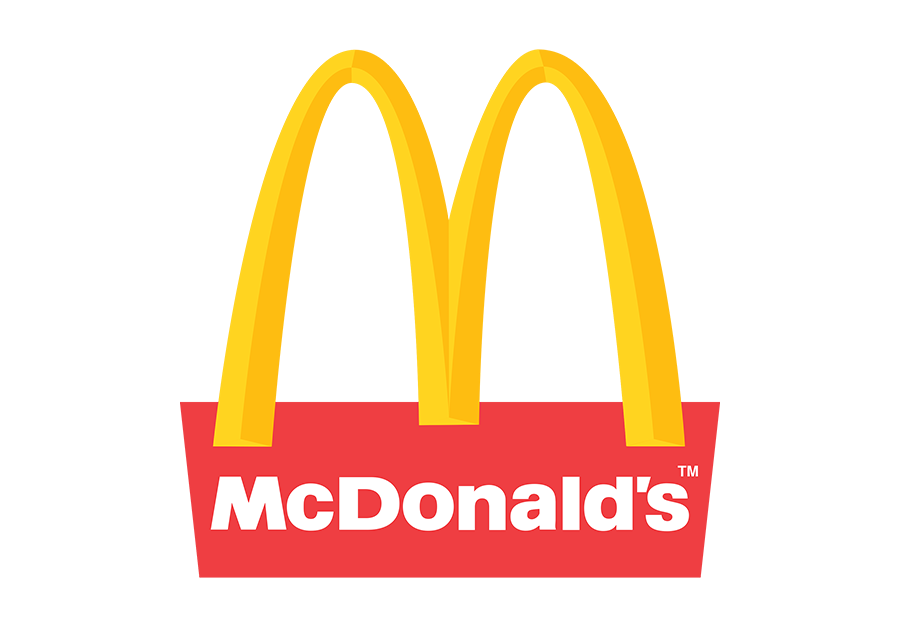
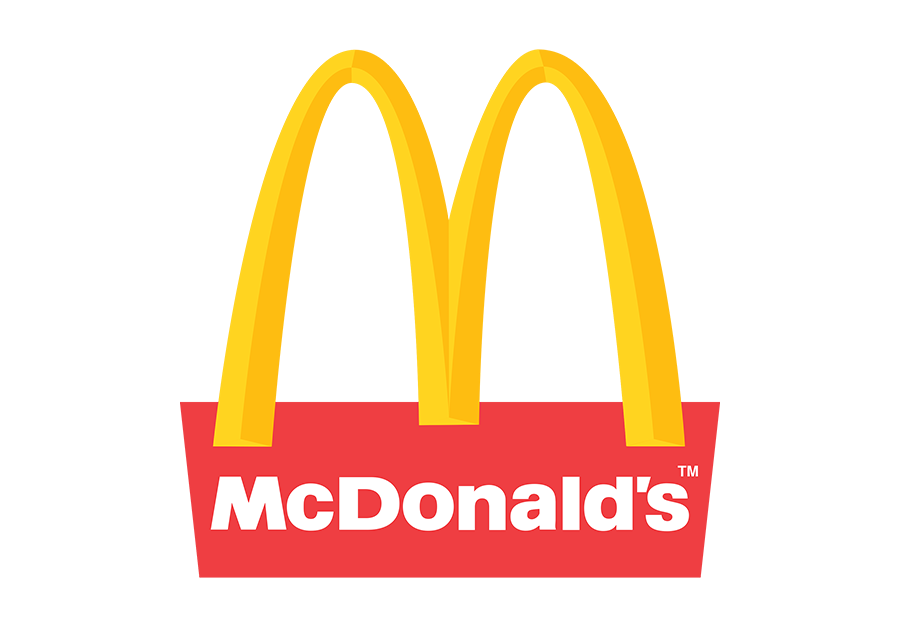
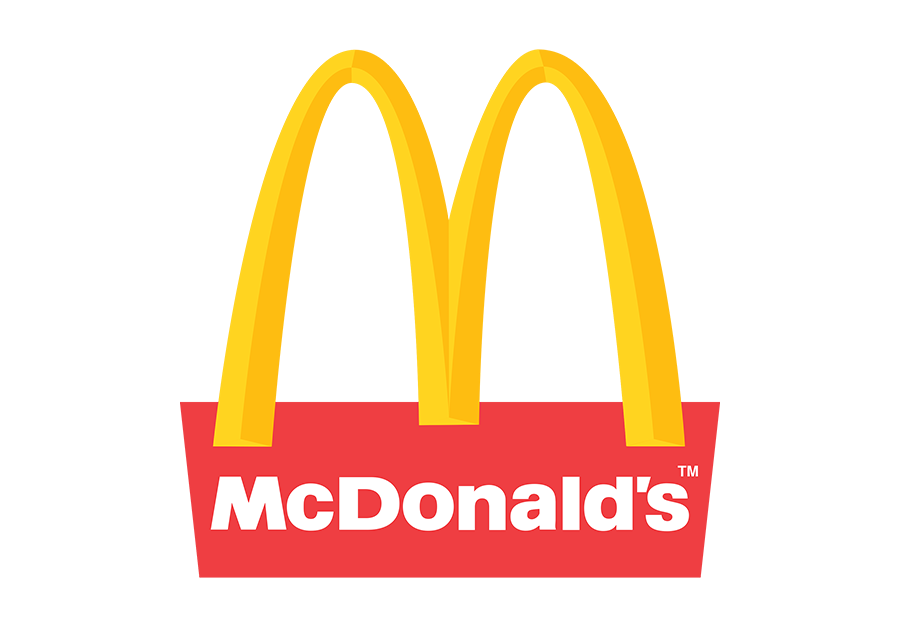
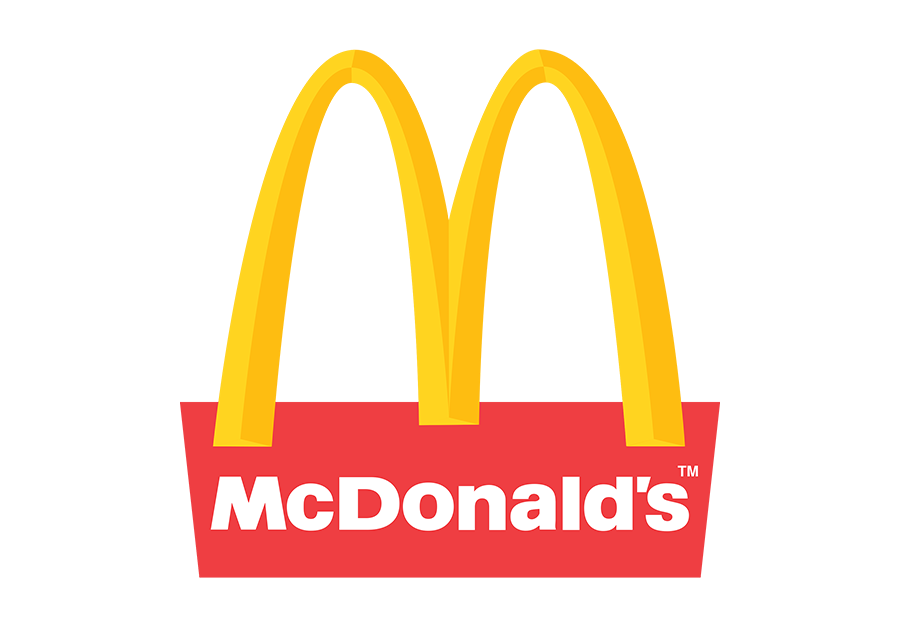
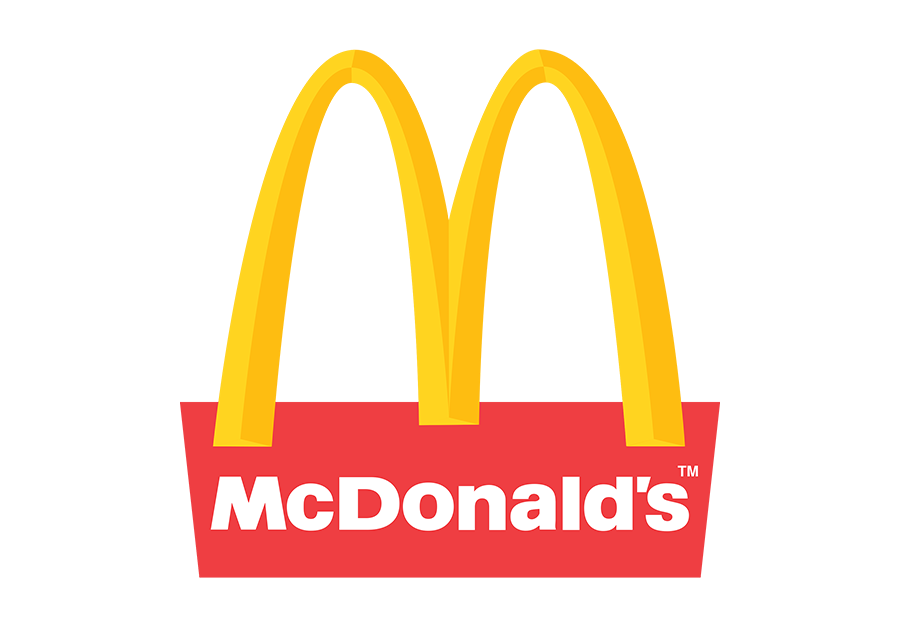
...
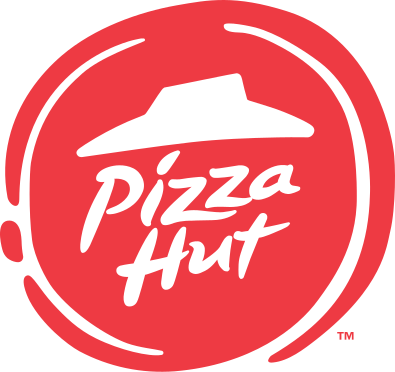
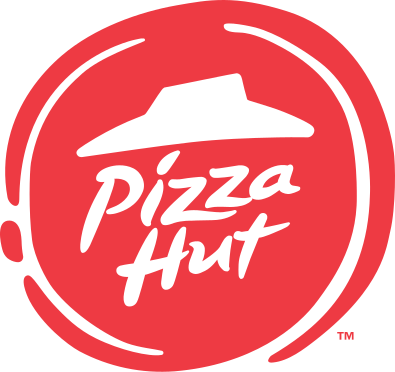
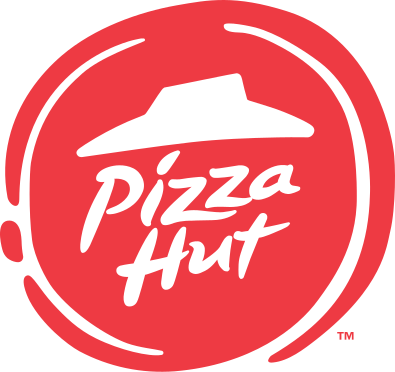
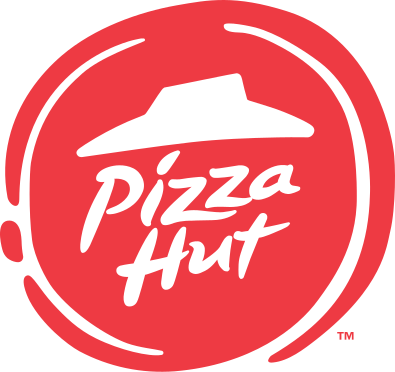
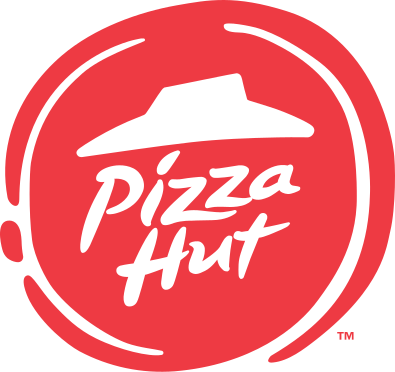

In [139]:
mapa = folium.Map(location=[data_MC.iloc[0]["Latitude"], data_MC.iloc[0]["Longitude"]], zoom_start=9)
icon_mc = '/content/McdonaldLogo.png'
icon_bk = '/content/tacobell.png'
icon_ph = '/content/pizza-hut.png'

for _, row in data_MC.iterrows():
    popup_content = f"""
    <strong>Address:</strong> {row['Address']}<br>
    <strong>Phone:</strong> {row['Phone']}<br>
    <strong>Rating:</strong> {row['Rating']}
    """

    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=folium.Popup(popup_content, max_width=80),
        icon=folium.CustomIcon(icon_mc, icon_size=(30, 30)),
    ).add_to(mapa)
for _, row in data_taco.iterrows():
    popup_content = f"""
    <strong>Address:</strong> {row['Address']}<br>
    <strong>Phone:</strong> {row['Phone']}<br>
    <strong>Rating:</strong> {row['Rating']}
    """

    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=folium.Popup(popup_content, max_width=80),
        icon=folium.CustomIcon(icon_bk, icon_size=(30, 30)),
    ).add_to(mapa)
for _, row in data_pizzahut.iterrows():
    popup_content = f"""
    <strong>Address:</strong> {row['Address']}<br>
    <strong>Phone:</strong> {row['Phone']}<br>
    <strong>Rating:</strong> {row['Rating']}
    """

    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=folium.Popup(popup_content, max_width=80),
        icon=folium.CustomIcon(icon_ph, icon_size=(27, 27)),
    ).add_to(mapa)


mapa
